# skibidi

In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import numpy as np
from PIL import Image
import os
from tensorflow.keras.models import load_model
import shutil
import random

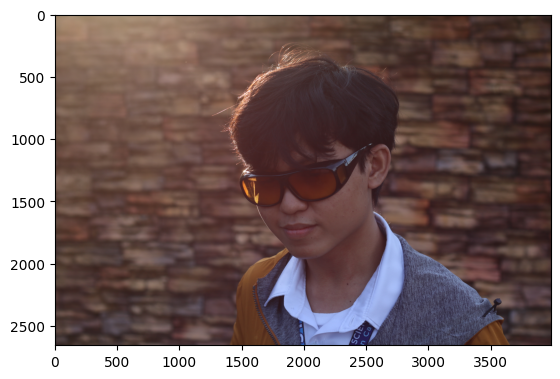

In [2]:
img = image.load_img('IMG_1018.jpg')
plt.imshow(img)

In [3]:
cv2.imread('IMG_1018.jpg')

array([[[103, 132, 153],
        [104, 133, 154],
        [107, 133, 157],
        ...,
        [ 31,  36,  51],
        [ 29,  36,  51],
        [ 27,  34,  49]],

       [[104, 133, 154],
        [104, 133, 154],
        [104, 133, 154],
        ...,
        [ 30,  36,  49],
        [ 30,  36,  49],
        [ 29,  35,  48]],

       [[105, 134, 155],
        [105, 134, 155],
        [104, 133, 154],
        ...,
        [ 28,  34,  45],
        [ 28,  34,  45],
        [ 28,  34,  45]],

       ...,

       [[ 38,  40,  48],
        [ 39,  41,  49],
        [ 41,  43,  51],
        ...,
        [ 38,  36,  56],
        [ 37,  35,  57],
        [ 35,  33,  55]],

       [[ 37,  37,  49],
        [ 37,  37,  49],
        [ 37,  39,  50],
        ...,
        [ 36,  35,  55],
        [ 36,  34,  56],
        [ 35,  33,  55]],

       [[ 40,  39,  55],
        [ 38,  37,  53],
        [ 37,  38,  52],
        ...,
        [ 37,  36,  56],
        [ 37,  35,  57],
        [ 36,  34,  56]]

In [29]:
# Define the source folders and corresponding destination folders
source_folders = [
    # "dataset/Biodegradable",
    # "dataset/Hazardous",
    # "dataset/Recyclable",
    "dataset/Residual",
    "dataset/Special"
]

destination_folders = [
    # "resized/Biodegradable",
    # "resized/Hazardous",
    # "resized/Recyclable",
    "resized/Residual",
    "resized/Special"
]

target_size = (256, 256)  # Resize target size

# Ensure that destination folders exist
for dest_folder in destination_folders:
    os.makedirs(dest_folder, exist_ok=True)

# Function to load and resize an image
def load_and_resize_image(image_path, target_size=(256, 256)):
    try:
        # Load the image from the file
        image = tf.io.read_file(image_path)
        image = tf.image.decode_image(image, channels=3)
        
        # Resize the image to the target size
        image = tf.image.resize(image, target_size)
        
        # Convert resized image to uint8 format for saving
        image = tf.cast(image, tf.uint8)
        
        return image
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None

# Iterate over source folders and resize images
for src_folder, dest_folder in zip(source_folders, destination_folders):
    # Get all image file paths in the current source folder
    image_files = [os.path.join(src_folder, fname) for fname in os.listdir(src_folder)
                   if fname.lower().endswith(('.jpg', '.png', '.jpeg'))]  # Add more formats if needed

    # Process and save each image
    for image_path in image_files:
        # Load and resize the image
        resized_image = load_and_resize_image(image_path, target_size=target_size)
        
        if resized_image is None:
            # Skip if there was an error loading or resizing the image
            continue
        
        # Create a new file name and path in the destination folder
        new_file_name = os.path.basename(image_path)
        output_image_path = os.path.join(dest_folder, new_file_name)
        
        try:
            # Encode and save the resized image
            encoded_image = tf.io.encode_jpeg(resized_image)  # Use tf.io.encode_png() if working with PNGs
            tf.io.write_file(output_image_path, encoded_image)
            print(f"Resized and saved: {output_image_path}")
        except Exception as e:
            print(f"Error saving image {output_image_path}: {e}")

Resized and saved: resized/Residual\00000000 (2).jpg
Resized and saved: resized/Residual\00000000 (3).jpg
Resized and saved: resized/Residual\00000000.jpg
Resized and saved: resized/Residual\00000001 (2).jpg
Resized and saved: resized/Residual\00000001 (3).jpg
Resized and saved: resized/Residual\00000001.jpg
Resized and saved: resized/Residual\00000002 (2).jpg
Resized and saved: resized/Residual\00000002 (3).jpg
Resized and saved: resized/Residual\00000002.jpg
Resized and saved: resized/Residual\00000003 (2).jpg
Resized and saved: resized/Residual\00000003 (3).jpg
Resized and saved: resized/Residual\00000003.jpg
Resized and saved: resized/Residual\00000004 (2).jpg
Resized and saved: resized/Residual\00000004.jpg
Resized and saved: resized/Residual\00000005 (2).jpg
Resized and saved: resized/Residual\00000005 (3).jpg
Resized and saved: resized/Residual\00000005.jpg
Resized and saved: resized/Residual\00000006 (2).jpg
Resized and saved: resized/Residual\00000006.jpg
Resized and saved: re

In [24]:
# Define the folder containing the images
image_folder = "dataset/Biodegradable"

# Get all file paths in the folder
image_files = os.listdir(image_folder)

# Iterate over the files and delete the ones with the 'resized_' prefix
for file_name in image_files:
    if file_name.startswith('resized_'):  # Change this if you used a different naming convention
        file_path = os.path.join(image_folder, file_name)
        os.remove(file_path)
        print(f"Deleted resized image: {file_path}")

Deleted resized image: dataset/Biodegradable\resized_00000000 (2).jpg
Deleted resized image: dataset/Biodegradable\resized_00000000 (3).jpg
Deleted resized image: dataset/Biodegradable\resized_00000000.jpg
Deleted resized image: dataset/Biodegradable\resized_00000001 (2).jpg
Deleted resized image: dataset/Biodegradable\resized_00000001.jpg
Deleted resized image: dataset/Biodegradable\resized_00000002 (2).jpg
Deleted resized image: dataset/Biodegradable\resized_00000002.jpg
Deleted resized image: dataset/Biodegradable\resized_00000003 (2).jpg
Deleted resized image: dataset/Biodegradable\resized_00000003 (3).jpg
Deleted resized image: dataset/Biodegradable\resized_00000003.jpg
Deleted resized image: dataset/Biodegradable\resized_00000004 (2).jpg
Deleted resized image: dataset/Biodegradable\resized_00000004 (3).jpg
Deleted resized image: dataset/Biodegradable\resized_00000004.jpg
Deleted resized image: dataset/Biodegradable\resized_00000005 (2).jpg
Deleted resized image: dataset/Biodegrad

In [44]:
# Define source directories
train_dir = "base/train"
test_dir = "base/test"

# Function to convert image to PNG
def convert_to_png(image_path, output_path):
    try:
        with Image.open(image_path) as img:
            img = img.convert('RGB')  # Convert to RGB if not already
            img.save(output_path, format='PNG')
        print(f"Converted {image_path} to {output_path}")
    except Exception as e:
        print(f"Error converting {image_path}: {e}")

# Function to process images in a directory
def process_directory(directory):
    for root, dirs, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            file_name, file_ext = os.path.splitext(file)
            
            if file_ext.lower() not in ['.png']:
                output_file_path = os.path.join(root, f"{file_name}.png")
                convert_to_png(file_path, output_file_path)
                os.remove(file_path)  # Remove the original file after conversion

# Process train and test directories
process_directory(train_dir)
process_directory(test_dir)

print("Conversion completed.")


Converted base/train\Biodegradable\Biodegradable_0001.jpg to base/train\Biodegradable\Biodegradable_0001.png
Converted base/train\Biodegradable\Biodegradable_0002.jpg to base/train\Biodegradable\Biodegradable_0002.png
Converted base/train\Biodegradable\Biodegradable_0004.jpg to base/train\Biodegradable\Biodegradable_0004.png
Converted base/train\Biodegradable\Biodegradable_0005.jpg to base/train\Biodegradable\Biodegradable_0005.png
Converted base/train\Biodegradable\Biodegradable_0006.JPG to base/train\Biodegradable\Biodegradable_0006.png
Converted base/train\Biodegradable\Biodegradable_0007.jpg to base/train\Biodegradable\Biodegradable_0007.png
Converted base/train\Biodegradable\Biodegradable_0008.jpg to base/train\Biodegradable\Biodegradable_0008.png
Converted base/train\Biodegradable\Biodegradable_0009.JPG to base/train\Biodegradable\Biodegradable_0009.png
Converted base/train\Biodegradable\Biodegradable_0010.jpg to base/train\Biodegradable\Biodegradable_0010.png
Converted base/trai

C:\Users\marty\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\PIL\Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Converted base/train\Recyclable\Recyclable_0267.jpg to base/train\Recyclable\Recyclable_0267.png
Converted base/train\Recyclable\Recyclable_0268.jpg to base/train\Recyclable\Recyclable_0268.png
Converted base/train\Recyclable\Recyclable_0269.jpg to base/train\Recyclable\Recyclable_0269.png
Converted base/train\Recyclable\Recyclable_0270.jpg to base/train\Recyclable\Recyclable_0270.png
Converted base/train\Recyclable\Recyclable_0272.jpg to base/train\Recyclable\Recyclable_0272.png
Converted base/train\Recyclable\Recyclable_0273.jpg to base/train\Recyclable\Recyclable_0273.png
Converted base/train\Recyclable\Recyclable_0274.jpg to base/train\Recyclable\Recyclable_0274.png
Converted base/train\Recyclable\Recyclable_0275.jpg to base/train\Recyclable\Recyclable_0275.png
Converted base/train\Recyclable\Recyclable_0279.jpg to base/train\Recyclable\Recyclable_0279.png
Converted base/train\Recyclable\Recyclable_0280.jpg to base/train\Recyclable\Recyclable_0280.png
Converted base/train\Recyclabl

C:\Users\marty\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\PIL\Image.py:3218: DecompressionBombWarning: Image size (105042001 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Converted base/train\Residual\Residual_1574.jpeg to base/train\Residual\Residual_1574.png
Converted base/train\Residual\Residual_15740.JPG to base/train\Residual\Residual_15740.png
Converted base/train\Residual\Residual_15742.jpg to base/train\Residual\Residual_15742.png
Converted base/train\Residual\Residual_15743.jpg to base/train\Residual\Residual_15743.png
Converted base/train\Residual\Residual_15744.jpg to base/train\Residual\Residual_15744.png
Converted base/train\Residual\Residual_15745.jpg to base/train\Residual\Residual_15745.png
Converted base/train\Residual\Residual_15746.jpg to base/train\Residual\Residual_15746.png
Converted base/train\Residual\Residual_15747.jpg to base/train\Residual\Residual_15747.png
Converted base/train\Residual\Residual_15748.jpg to base/train\Residual\Residual_15748.png
Converted base/train\Residual\Residual_1575.jpg to base/train\Residual\Residual_1575.png
Converted base/train\Residual\Residual_15750.jpg to base/train\Residual\Residual_15750.png
Co

In [53]:
# Define source folders and target directories
source_folders = [
    "resized/Biodegradable",
    "resized/Hazardous",
    "resized/Recyclable",
    "resized/Residual",
    "resized/Special"
]

train_dir = "base/train"
test_dir = "base/test"

# Define split ratio
train_ratio = 0.99  # 99% for training
test_ratio = 0.01   # 1% for testing

# Ensure that target directories exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Function to create class subdirectories
def create_class_subdirectories(base_dir, class_names):
    for class_name in class_names:
        os.makedirs(os.path.join(base_dir, class_name), exist_ok=True)

# Create class subdirectories in train and test directories
class_names = [os.path.basename(folder) for folder in source_folders]  # Get class names from source folder names
create_class_subdirectories(train_dir, class_names)
create_class_subdirectories(test_dir, class_names)

# Process each source folder
for src_folder in source_folders:
    class_name = os.path.basename(src_folder)
    
    # Get all image file paths in the current source folder
    image_files = [os.path.join(src_folder, fname) for fname in os.listdir(src_folder)
                   if fname.lower().endswith(('.jpg', '.png', '.jpeg'))]  # Add more formats if needed
    
    # Shuffle the image files
    random.shuffle(image_files)
    
    # Determine the number of training and testing images
    total_images = len(image_files)
    num_train_images = int(total_images * train_ratio)
    num_test_images = total_images - num_train_images
    
    # Split the files into training and testing sets
    train_files = image_files[:num_train_images]
    test_files = image_files[num_train_images:]
    
    # Move and rename training images
    for idx, image_path in enumerate(train_files):
        new_name = f"{class_name}_{idx+1:04d}{os.path.splitext(image_path)[1]}"
        new_path = os.path.join(train_dir, class_name, new_name)
        shutil.copy(image_path, new_path)
        print(f"Copied and renamed {image_path} to {new_path}")
    
    # Move and rename testing images
    for idx, image_path in enumerate(test_files):
        new_name = f"{class_name}_{idx+1:04d}{os.path.splitext(image_path)[1]}"
        new_path = os.path.join(test_dir, class_name, new_name)
        shutil.copy(image_path, new_path)
        print(f"Copied and renamed {image_path} to {new_path}")

print("Data splitting and organization completed.")


Copied and renamed resized/Biodegradable\2d65b450-78b3-45db-ae98-2ee76f9fe1e2___GHLB2 Leaf 9116.JPG to base/train\Biodegradable\Biodegradable_0001.JPG
Copied and renamed resized/Biodegradable\00000006 (2).jpg to base/train\Biodegradable\Biodegradable_0002.jpg
Copied and renamed resized/Biodegradable\Image_188 (3).png to base/train\Biodegradable\Biodegradable_0003.png
Copied and renamed resized/Biodegradable\paper408(1).jpg to base/train\Biodegradable\Biodegradable_0004.jpg
Copied and renamed resized/Biodegradable\paper210 (3).jpg to base/train\Biodegradable\Biodegradable_0005.jpg
Copied and renamed resized/Biodegradable\cardboard191.jpg to base/train\Biodegradable\Biodegradable_0006.jpg
Copied and renamed resized/Biodegradable\anigre-60x60.jpg to base/train\Biodegradable\Biodegradable_0007.jpg
Copied and renamed resized/Biodegradable\paper586 (3).jpg to base/train\Biodegradable\Biodegradable_0008.jpg
Copied and renamed resized/Biodegradable\cardboard81 (2).jpg to base/train\Biodegradab

In [1]:
import tensorflow as tf
import os

# Define directories for training and testing data
train_dir = "base/train"
test_dir = "base/test"

# Parameters
batch_size = 32
img_height = 256
img_width = 256
num_classes = 5

# Function to load and preprocess images
def preprocess_image(image, label):
    image = tf.image.resize(image, [img_height, img_width])
    image = image / 255.0  # Normalize to [0, 1]
    return image, label

# Function to decode images
def decode_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image, channels=3)
    return image

# Create a TensorFlow dataset from the directory
def load_dataset(directory):
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        directory,
        image_size=(img_height, img_width),
        batch_size=batch_size,
        label_mode='int',  # Use 'int' for integer labels
        shuffle=True
    )
    dataset = dataset.map(preprocess_image)
    return dataset

train_ds = load_dataset(train_dir)
test_ds = load_dataset(test_dir)

# Create and compile the model
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(num_classes, activation='softmax')  # Output layer with 5 classes
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(
    train_ds,
    validation_data=test_ds,
    epochs=30
)

# Evaluate the model
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test accuracy: {test_acc:.2f}")

# Save the model
model.save("model/skibidi_model_a.keras")

Found 51397 files belonging to 5 classes.
Found 522 files belonging to 5 classes.
Epoch 1/30


C:\Users\marty\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


1607/1607 ━━━━━━━━━━━━━━━━━━━━ 1119s 693ms/step - accuracy: 0.5641 - loss: 1.1165 - val_accuracy: 0.7088 - val_loss: 0.7640
Epoch 2/30
1607/1607 ━━━━━━━━━━━━━━━━━━━━ 1104s 687ms/step - accuracy: 0.7276 - loss: 0.7072 - val_accuracy: 0.7280 - val_loss: 0.7593
Epoch 3/30
1607/1607 ━━━━━━━━━━━━━━━━━━━━ 1104s 687ms/step - accuracy: 0.8104 - loss: 0.5014 - val_accuracy: 0.7471 - val_loss: 0.8496
Epoch 4/30
1607/1607 ━━━━━━━━━━━━━━━━━━━━ 1103s 686ms/step - accuracy: 0.8860 - loss: 0.3099 - val_accuracy: 0.7950 - val_loss: 0.8998
Epoch 5/30
1607/1607 ━━━━━━━━━━━━━━━━━━━━ 1102s 686ms/step - accuracy: 0.9400 - loss: 0.1739 - val_accuracy: 0.7874 - val_loss: 1.1619
Epoch 6/30
1607/1607 ━━━━━━━━━━━━━━━━━━━━ 1101s 685ms/step - accuracy: 0.9574 - loss: 0.1300 - val_accuracy: 0.7835 - val_loss: 1.3637
Epoch 7/30
1607/1607 ━━━━━━━━━━━━━━━━━━━━ 1101s 685ms/step - accuracy: 0.9672 - loss: 0.0984 - val_accuracy: 0.7778 - val_loss: 1.5614
Epoch 8/30
1607/1607 ━━━━━━━━━━━━━━━━━━━━ 1099s 684ms/step - accur

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
Predicted class index: 0
Predicted class name: Biodegradable


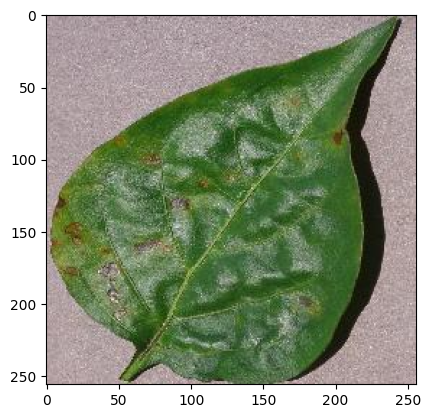

In [8]:
# Parameters (must match the ones used during training)
img_height = 256
img_width = 256
class_names = ["Biodegradable", "Hazardous", "Recyclable", "Residual", "Special"]

# Load the saved model
model = load_model("model/skibidi_model_a.keras")

# Function to load and preprocess an image
def preprocess_image(image_path):
    # Open the image using PIL
    img = Image.open(image_path)
    
    # Resize the image to match the input shape of the model
    img = img.resize((img_width, img_height))
    
    # Convert the image to a NumPy array
    img_array = np.array(img)
    
    # Normalize the pixel values (scale to [0, 1])
    img_array = img_array / 255.0
    
    # Add a batch dimension (1, height, width, 3)
    img_array = np.expand_dims(img_array, axis=0)
    
    return img_array

# Function to make a prediction on a new image
def predict_image(image_path):
    # Preprocess the image
    test_image = preprocess_image(image_path)
    
    # Make a prediction
    predictions = model.predict(test_image)
    
    # Get the predicted class (index of the highest probability)
    predicted_class = np.argmax(predictions)
    
    # Get the predicted class name
    predicted_class_name = class_names[predicted_class]
    
    # Print the predicted class and class name
    print(f"Predicted class index: {predicted_class}")
    print(f"Predicted class name: {predicted_class_name}")

# Path to the new image you want to test
image_path = "trial/img3.jpg"

# Open the image
img2 = Image.open(image_path)

# Resize the image to 256x256
resized_img = img2.resize((256, 256))

# Save the resized image (optional)
resized_img.save("trial/realtrial.png")

# Path to the new image you want to test
image_path = "trial/realtrial.png"

imga = image.load_img(image_path)
plt.imshow(imga)

# Test the model on a new image
predict_image(image_path)


[[[[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  ...

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]]]


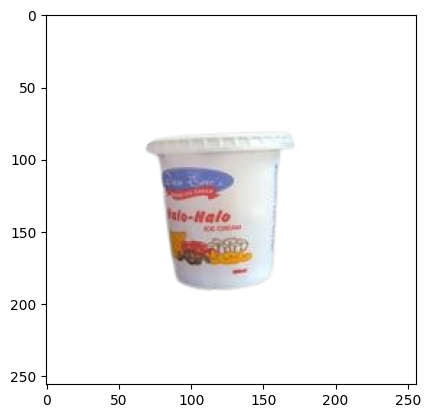

In [27]:
img = image.load_img('trial/trial11.png')
plt.imshow(img)

png = np.expand_dims(img, axis=0)
print(png)

In [9]:
# Parameters (must match the ones used during training)
img_height = 256
img_width = 256
batch_size = 32
class_names = ["Biodegrabale", "Hazardous", "Recyclable", "Residual", "Special"]

# Path to the validation dataset
validation_dir = "base/test"

# Load the saved model
model = load_model("model/skibidi_model_a.keras")

In [1]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image_dataset_from_directory
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Parameters (must match the ones used during training)
img_height = 256
img_width = 256
batch_size = 32
class_names = ["Biodegrabale", "Hazardous", "Recyclable", "Residual", "Special"]

# Path to the validation dataset
validation_dir = "base/train"

# Load the saved model
model = load_model("model/skibidi_model_a.keras")

# Load validation dataset
validation_ds = image_dataset_from_directory(
    validation_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    label_mode='int',
    shuffle=False,
)

# Compile the model again (needed if you want to evaluate it)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Make predictions on the validation dataset
predictions = model.predict(validation_ds)
predicted_classes = tf.argmax(predictions, axis=1)

# Get true labels
true_labels = np.concatenate([y for x, y in validation_ds])

# Compile the results into a table (NumPy array with 4 columns)
results = np.zeros((len(true_labels), 4), dtype=object)  # [Image Index, True Label, Predicted Label, Correct/Incorrect]
for i in range(len(true_labels)):
    results[i, 0] = i + 1  # Image Index
    results[i, 1] = class_names[true_labels[i]]  # True Label
    results[i, 2] = class_names[predicted_classes[i]]  # Predicted Label
    results[i, 3] = "Correct" if true_labels[i] == predicted_classes[i] else "Incorrect"

# Save the results into a CSV file
df_results = pd.DataFrame(results, columns=["Image Index", "True Label", "Predicted Label", "Correct/Incorrect"])
df_results.to_csv("validation_results.csv", index=False)

# Calculate accuracy for each class using pandas
class_accuracies = df_results.groupby('True Label').apply(
    lambda x: (x['Correct/Incorrect'] == 'Correct').mean()
).reset_index(name='Accuracy')

# Plot the bar graph using pandas
class_accuracies.set_index('True Label').plot(kind='bar', pallete='magma', legend=False)
plt.xlabel("Class")
plt.ylabel("Accuracy")
plt.title("Accuracy per Class")
plt.xticks(rotation=45)
plt.tight_layout()

# Save the bar graph
plt.savefig("class_accuracies_pandas.png")
plt.show()



Found 51397 files belonging to 5 classes.
 152/1607 ━━━━━━━━━━━━━━━━━━━━ 5:55 244ms/step